<!-- WARNING: THIS FILE WAS AUTOGENERATED! DO NOT EDIT! -->

In [ ]:
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
import seaborn as sns
import torch
from IPython.display import HTML
from matplotlib.animation import ArtistAnimation
from tqdm import tqdm

from diffdrr import DRR, load_example_ct
from diffdrr.metrics import XCorr2
from diffdrr.visualization import animate, plot_drr

np.random.seed(39)

In [ ]:
def converged(df):
    return df["loss"].iloc[-1] <= -0.999

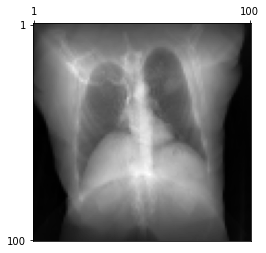

In [ ]:
# Make the ground truth X-ray
SDR = 200.0
HEIGHT = 100
DELX = 5e-2

volume, spacing = load_example_ct()
bx, by, bz = np.array(volume.shape) * np.array(spacing) / 2
true_params = {
    "sdr": SDR,
    "theta": torch.pi,
    "phi": 0,
    "gamma": torch.pi / 2,
    "bx": bx,
    "by": by,
    "bz": bz,
}

drr = DRR(volume, spacing, height=HEIGHT, delx=DELX, device="cuda")
ground_truth = drr(**true_params)

plot_drr(ground_truth)
plt.show()

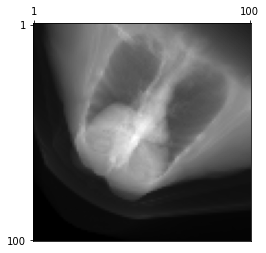

In [ ]:
# Make a random DRR
def get_initial_parameters(true_params):
    sdr = true_params["sdr"]
    theta = true_params["theta"] + np.random.uniform(-np.pi / 4, np.pi / 4)
    phi = true_params["phi"] + np.random.uniform(-np.pi / 3, np.pi / 3)
    gamma = true_params["gamma"] + np.random.uniform(-np.pi / 3, np.pi / 3)
    bx = true_params["bx"] + np.random.uniform(-30.0, 31.0)
    by = true_params["by"] + np.random.uniform(-30.0, 31.0)
    bz = true_params["bz"] + np.random.uniform(-30.0, 31.0)
    return sdr, theta, phi, gamma, bx, by, bz


sdr, theta, phi, gamma, bx, by, bz = get_initial_parameters(true_params)
est = drr(sdr, theta, phi, gamma, bx, by, bz)  # Initialize the DRR generator

plot_drr(est)
plt.show()

In [ ]:
def optimize(
    drr,
    ground_truth,
    lr_rotations=5.3e-2,
    lr_translations=7.5e1,
    momentum=0,
    dampening=0,
    n_itrs=250
):
    criterion = XCorr2(zero_mean_normalized=True)
    optimizer = torch.optim.SGD(
        [
            {"params": [drr.rotations], "lr": lr_rotations},
            {"params": [drr.translations], "lr": lr_translations},
        ],
        momentum=momentum,
        dampening=dampening,
    )
    
    params = []
    for itr in tqdm(range(n_itrs)):
        estimate = drr()
        theta, phi, gamma = drr.rotations.squeeze()
        bx, by, bz = drr.translations.squeeze()
        params.append([i.item() for i in [theta, phi, gamma, bx, by, bz]])
        loss = -criterion(ground_truth, estimate)
        optimizer.zero_grad()
        loss.backward(retain_graph=True)
        optimizer.step()
        
        if loss < -0.999:
            tqdm.write(f"Converged in {itr} iterations")
            break
        
    return pd.DataFrame(params, columns=["theta", "phi", "gamma", "bx", "by", "bz"])

In [ ]:
# Base SGD
drr(sdr, theta, phi, gamma, bx, by, bz)
params_base = optimize(drr, ground_truth)

# SGD + momentum
drr(sdr, theta, phi, gamma, bx, by, bz)
params_momentum = optimize(drr, ground_truth, momentum=0.9)

# SGD + momentum + dampening
drr(sdr, theta, phi, gamma, bx, by, bz)
params_momentum_dampen = optimize(drr, ground_truth, momentum=0.9, dampening=0.1)

 40%|█████████████████████████████████▏                                                | 101/250 [00:03<00:05, 26.04it/s]


Converged in 101 iterations


 27%|██████████████████████▌                                                            | 68/250 [00:02<00:07, 25.83it/s]


Converged in 68 iterations


 21%|█████████████████▌                                                                 | 53/250 [00:02<00:07, 25.78it/s]

Converged in 53 iterations


In [ ]:
def precompute_drrs(df, sdr, drr, ax, max_len=len(params_base)):
    imgs = []
    for idx, row in df.iterrows():
        params = row[["theta", "phi", "gamma", "bx", "by", "bz"]].values
        itr = drr(sdr, *params)
        img = plot_drr(itr, animated=True, ax=ax)
        if idx == 0:
            plot_drr(itr, ax=ax)
        imgs.append(img)
    for _ in range(max_len - len(df)):
        imgs.append(img)
    return imgs

In [ ]:
fig, axs = plt.subplots(ncols=4, dpi=300, figsize=(10, 3), constrained_layout=True)

plot_drr(ground_truth, ax=axs[0])
imgs1 = precompute_drrs(params_base, SDR, drr, axs[1])
imgs2 = precompute_drrs(params_momentum, SDR, drr, axs[2])
imgs3 = precompute_drrs(params_momentum_dampen, SDR, drr, axs[3])
imgs = [[*ims] for ims in zip(imgs1, imgs2, imgs3)]

anim = ArtistAnimation(fig, imgs, interval=50, blit=True, repeat_delay=1000)
plt.close()

HTML(anim.to_jshtml())

## `SciPy` optimization algorithms

In [ ]:
import scipy

In [ ]:
PARAMS = []

def gradfree(geoparams, *optimparams):
    """
    optimparams = (drr, criterion, ground_truth, sdr)
    """
    theta, phi, gamma = geoparams[:3]
    bx, by, bz = geoparams[3:]
    estimate = drr(sdr, theta, phi, gamma, bx, by, bz)
    loss = -criterion(ground_truth, estimate).item()
    
    PARAMS.append([loss, theta, phi, gamma, bx, by, bz])
    
    return loss

In [ ]:
criterion = XCorr2(zero_mean_normalized=True)

In [ ]:
x0 = [theta, phi, gamma, bx, by, bz]
args = [drr, criterion, ground_truth, sdr]
scipy.optimize.minimize(gradfree, x0, args, method="Nelder-Mead")

 final_simplex: (array([[  4.19414617,   0.31496119,   1.52000113, 188.77252245,
        168.06425703, 147.39858006],
       [  4.19414635,   0.31496084,   1.52000135, 188.77254168,
        168.06430405, 147.39855893],
       [  4.19414606,   0.31496127,   1.52000116, 188.77251287,
        168.06428231, 147.39856602],
       [  4.19414599,   0.31496116,   1.52000089, 188.77251456,
        168.06433548, 147.39857394],
       [  4.19414594,   0.31496119,   1.5200008 , 188.77251137,
        168.06433502, 147.39860248],
       [  4.19414616,   0.31496141,   1.52000109, 188.77248973,
        168.06427643, 147.39857169],
       [  4.19414612,   0.31496086,   1.52000096, 188.7725769 ,
        168.06422458, 147.39860207]]), array([-0.81089503, -0.81089497, -0.81089485, -0.81089485, -0.81089485,
       -0.81089485, -0.81089479]))
           fun: -0.8108950257301331
       message: 'Optimization terminated successfully.'
          nfev: 687
           nit: 426
        status: 0
       success: T

In [ ]:
HTML(animate(params[::5], sdr, drr))

Precomputing DRRs: 100%|███████████████████████████████████████████████████████████████| 138/138 [00:03<00:00, 38.88it/s]
